Data Loading

In [ ]:
!pip install opendatasets
!pip install pandas

In [ ]:
import opendatasets as od
import pandas

od.download(
    "https://www.kaggle.com/datasets/cdaclab/unisolar")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: ishika417
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/cdaclab/unisolar


100%|██████████| 14.7M/14.7M [00:00<00:00, 43.7MB/s]


Data Merging

In [ ]:
import pandas as pd

# Read the CSV files into DataFrames
df1 = pd.read_csv('/content/unisolar/unisolar/Solar_Energy_Generation.csv')
df2 = pd.read_csv('/content/unisolar/unisolar/Solar_Site_Details.csv')
df3 = pd.read_csv('/content/unisolar/unisolar/Weather_Data_reordered_all.csv')

interpolated_df = df1.bfill()
# Merge DataFrames on 'CampusKey' and 'Timestamp'
# merged_df = pd.merge(df1, df2, on=['CampusKey','Sitekey'])
merged_df = pd.merge(interpolated_df, df3, on=['CampusKey', 'Timestamp'])

# Set 'Timestamp' as the index
merged_df.set_index('Timestamp', inplace=True)

# Display the resulting DataFrame
print(merged_df.head())


                     CampusKey  SiteKey  SolarGeneration  ApparentTemperature  \
Timestamp                                                                       
2020-01-01 00:15:00          2        1            0.135            18.560000   
2020-01-01 00:15:00          2        2            0.100            18.560000   
2020-01-01 00:15:00          2        3            0.239            18.560000   
2020-01-01 00:30:00          2        1            0.135            18.146667   
2020-01-01 00:30:00          2        2            0.100            18.146667   

                     AirTemperature  DewPointTemperature  RelativeHumidity  \
Timestamp                                                                    
2020-01-01 00:15:00           20.30                 9.60         50.266667   
2020-01-01 00:15:00           20.30                 9.60         50.266667   
2020-01-01 00:15:00           20.30                 9.60         50.266667   
2020-01-01 00:30:00           19.84       

In [ ]:
merged_df = merged_df[~merged_df.index.duplicated(keep='first')]

In [ ]:
# Save merged_df to a CSV file
merged_df.to_csv('merged_data.csv', index=True)  # Set index=True to include the Timestamp index in the CSV

print("Merged data saved to 'merged_data.csv'.")

Merged data saved to 'merged_data.csv'.


In [ ]:
import pandas as pd
merged_df = pd.read_csv('/content/merged_data.csv')

In [ ]:
features = ['ApparentTemperature', 'AirTemperature', 'DewPointTemperature', 'RelativeHumidity', 'WindSpeed', 'WindDirection']
X = merged_df[features]
y = merged_df['SolarGeneration']


HeatMap

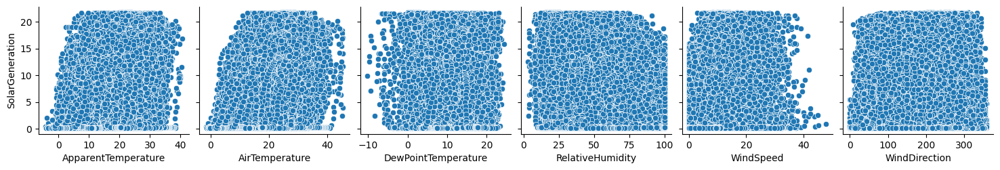

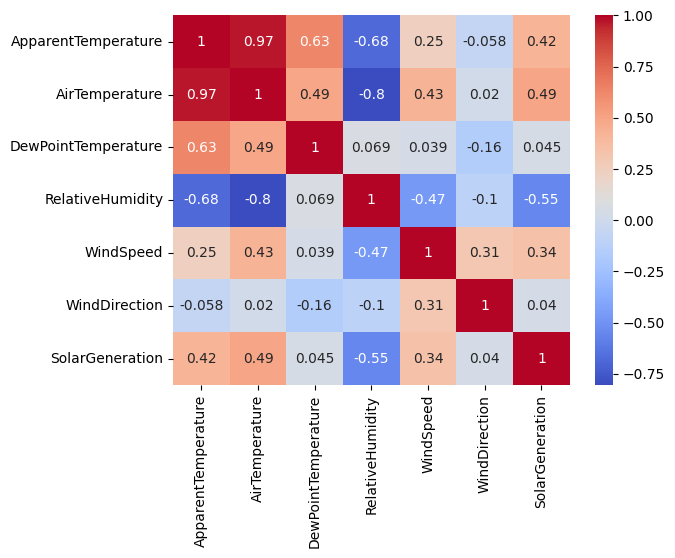

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pairplot to visualize relationships between features and SolarGeneration
sns.pairplot(merged_df, x_vars=features, y_vars=['SolarGeneration'])
plt.show()

# Correlation heatmap
correlation_matrix = merged_df[features + ['SolarGeneration']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()


*   Red: Positive correlation. This means that when one variable increases, the other variable also tends to increase. For example, the strong red correlation between Apparent Temperature and Air Temperature indicates that they are highly positively correlated.
*   Blue: Negative correlation. This means that when one variable increases, the other variable tends to decrease. For example, the blue correlation between Relative Humidity and Solar Generation suggests that as Relative Humidity increases, Solar Generation tends to decrease.
*   White: No correlation. This means that there is no significant relationship between the two variables.





<ipython-input-4-0e6217ba0776>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  optimal_sites['Timestamp'] = pd.to_datetime(optimal_sites['Timestamp'])
<ipython-input-4-0e6217ba0776>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  optimal_sites['Hour'] = optimal_sites['Timestamp'].dt.hour


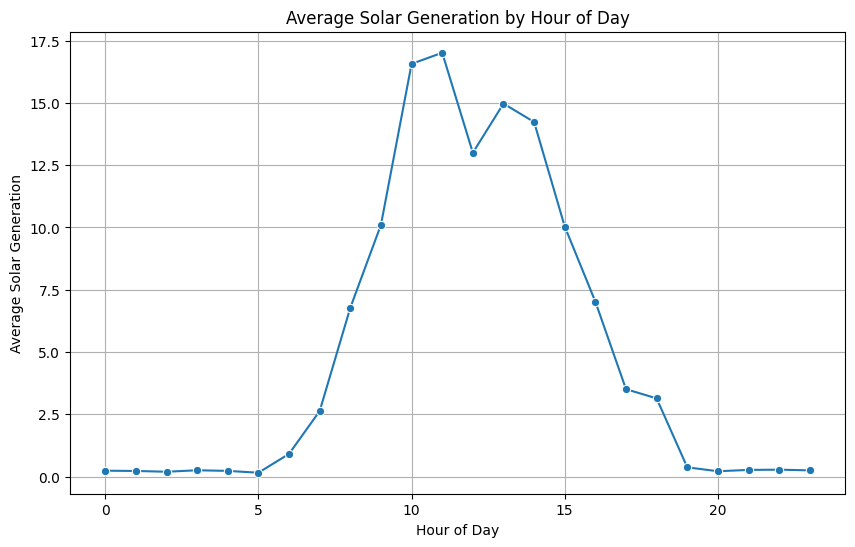

       SiteKey  CampusKey           Timestamp  SolarGeneration  Hour
32339        1          2 2020-12-11 11:00:00         21.09375    11
32049        1          2 2020-12-08 10:30:00         21.03125    10
40120        1          2 2021-03-06 13:15:00         19.96875    13
7925         1          2 2020-03-23 13:30:00         19.95300    13
7924         1          2 2020-03-23 13:15:00         19.81500    13
32337        1          2 2020-12-11 10:30:00         19.65625    10
8114         1          2 2020-03-25 12:45:00         19.18900    12
40210        1          2 2021-03-07 11:45:00         18.25000    11
42519        1          2 2021-03-31 13:00:00         18.21875    13
39537        1          2 2021-02-28 11:30:00         18.00000    11
8698         1          2 2020-03-31 14:45:00         17.84500    14
41           1          2 2020-01-01 10:30:00         17.44700    10
2344         1          2 2020-01-25 10:15:00         16.94000    10
39535        1          2 2021-02-

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your combined dataset
# Step 1: Determine Optimal Weather Conditions
# For example, you might have found that optimal solar generation occurs when:
# AirTemperature between 20-25, RelativeHumidity < 50, and WindSpeed < 5

df = merged_df

optimal_conditions = (df['AirTemperature'].between(20, 25)) & \
                     (df['RelativeHumidity'] < 50) & \
                     (df['WindSpeed'] < 5)

# Step 2: Filter the Dataset
df_optimal = df[optimal_conditions]

# Step 3: Extract SiteKey, CampusKey, and Timestamp
optimal_sites = df_optimal[['SiteKey', 'CampusKey', 'Timestamp', 'SolarGeneration']]

# Step 4: Analyze Time of Day
# Convert 'Timestamp' to datetime if it's not already
optimal_sites['Timestamp'] = pd.to_datetime(optimal_sites['Timestamp'])

# Extract the hour from the timestamp
optimal_sites['Hour'] = optimal_sites['Timestamp'].dt.hour

# Group by hour to find the average solar generation
hourly_generation = optimal_sites.groupby('Hour')['SolarGeneration'].mean().reset_index()

# Step 5: Visualize Results
plt.figure(figsize=(10, 6))
sns.lineplot(data=hourly_generation, x='Hour', y='SolarGeneration', marker='o')
plt.title('Average Solar Generation by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Solar Generation')
plt.grid(True)
plt.show()

# Identify the sites and times that contribute to optimal conditions
print(optimal_sites.sort_values(by='SolarGeneration', ascending=False).head(30))


K Means

Refined Cluster 1 Characteristics
          CampusKey       SiteKey  SolarGeneration  ApparentTemperature  \
count  27152.000000  27152.000000     27152.000000         27152.000000   
mean       1.996428      1.046442         4.422634            19.915921   
std        0.059664      0.775638         6.327940             4.473796   
min        1.000000      1.000000         0.100000            10.100000   
25%        2.000000      1.000000         0.218750            16.340000   
50%        2.000000      1.000000         0.437500            19.220000   
75%        2.000000      1.000000         7.187500            22.800000   
max        2.000000     14.000000        21.750000            35.746667   

       AirTemperature  DewPointTemperature  RelativeHumidity     WindSpeed  \
count    27152.000000         27152.000000      27152.000000  27152.000000   
mean        19.702702            14.876386         75.657931      5.965244   
std          4.003455             3.060937         16.39

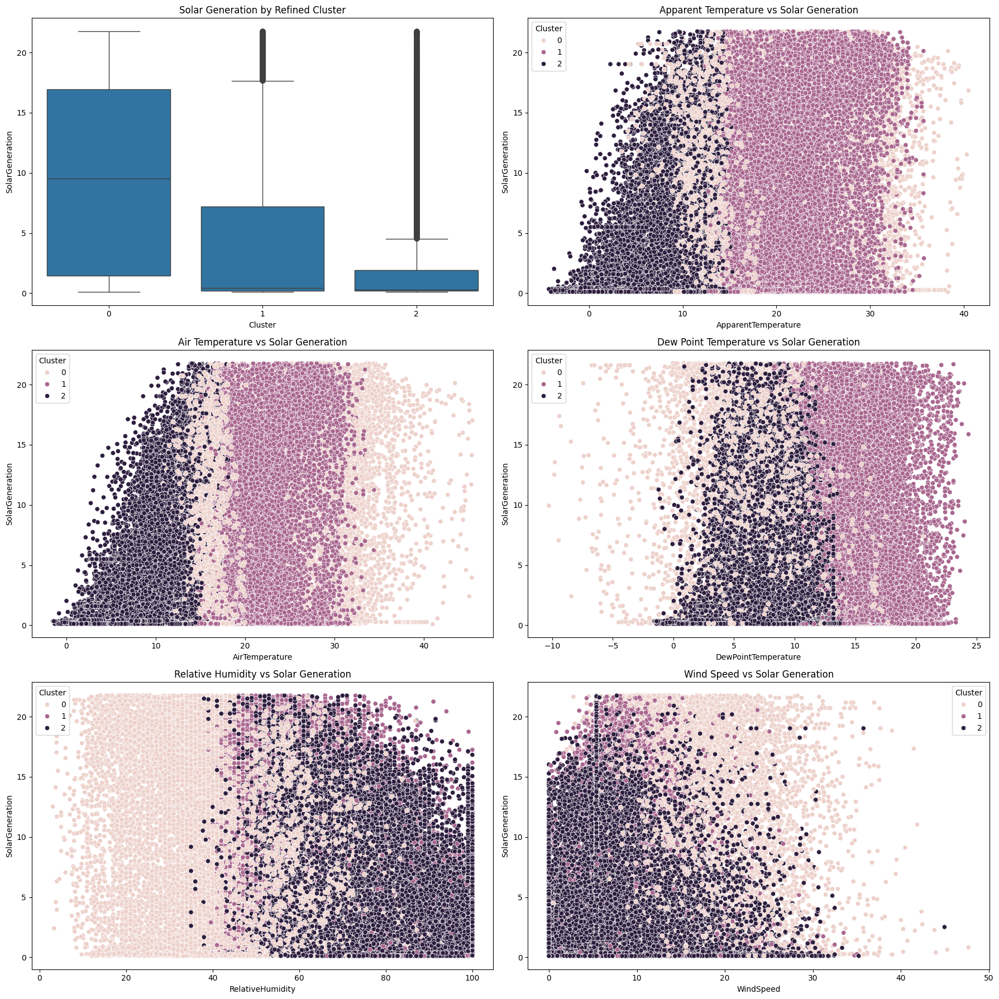

In [ ]:
# Example: Analyze Cluster Characteristics

# Analyze Refined Cluster 1
cluster1_data = df_refined[df_refined['Cluster'] == 1]
print("Refined Cluster 1 Characteristics")
print(cluster1_data.describe())

# Analyze Refined Cluster 2
cluster2_data = df_refined[df_refined['Cluster'] == 2]
print("Refined Cluster 2 Characteristics")
print(cluster2_data.describe())

# Analyze Refined Cluster 3
cluster3_data = df_refined[df_refined['Cluster'] == 3]
print("Refined Cluster 3 Characteristics")
print(cluster3_data.describe())

# Visualize each cluster's distribution
fig, axes = plt.subplots(3, 2, figsize=(18, 18))

sns.boxplot(x='Cluster', y='SolarGeneration', data=df_refined, ax=axes[0, 0])
axes[0, 0].set_title('Solar Generation by Refined Cluster')

sns.scatterplot(x='ApparentTemperature', y='SolarGeneration', hue='Cluster', data=df_refined, ax=axes[0, 1])
axes[0, 1].set_title('Apparent Temperature vs Solar Generation')

sns.scatterplot(x='AirTemperature', y='SolarGeneration', hue='Cluster', data=df_refined, ax=axes[1, 0])
axes[1, 0].set_title('Air Temperature vs Solar Generation')

sns.scatterplot(x='DewPointTemperature', y='SolarGeneration', hue='Cluster', data=df_refined, ax=axes[1, 1])
axes[1, 1].set_title('Dew Point Temperature vs Solar Generation')

sns.scatterplot(x='RelativeHumidity', y='SolarGeneration', hue='Cluster', data=df_refined, ax=axes[2, 0])
axes[2, 0].set_title('Relative Humidity vs Solar Generation')

sns.scatterplot(x='WindSpeed', y='SolarGeneration', hue='Cluster', data=df_refined, ax=axes[2, 1])
axes[2, 1].set_title('Wind Speed vs Solar Generation')

plt.tight_layout()
plt.show()


KNN

<ipython-input-18-1f1f5d5ec4d3>:14: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weather_data = df[weather_features].fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  supe

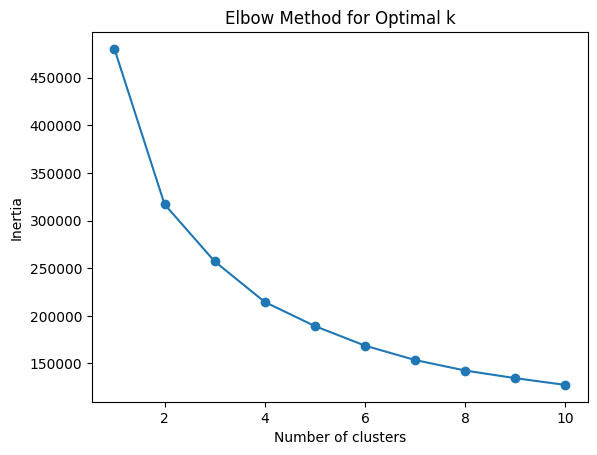

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


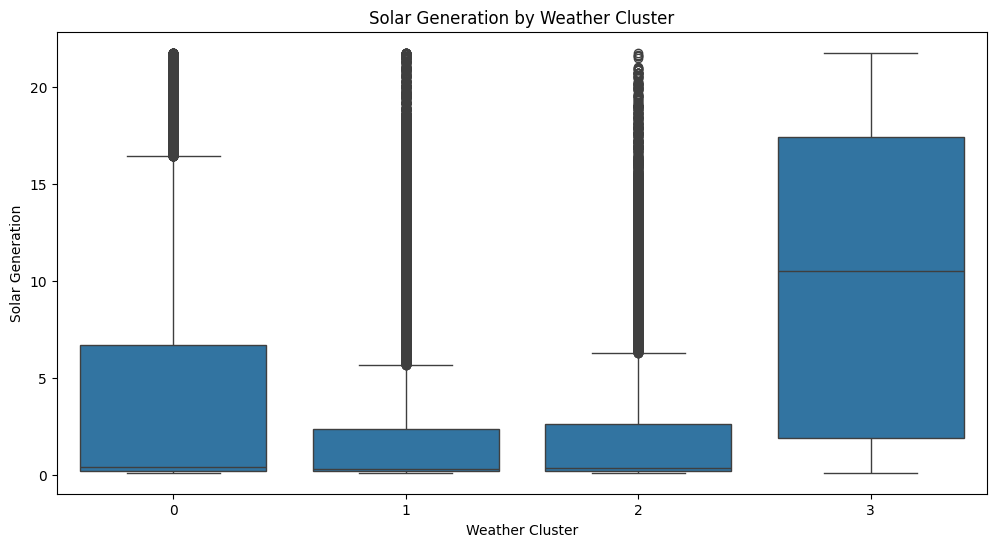

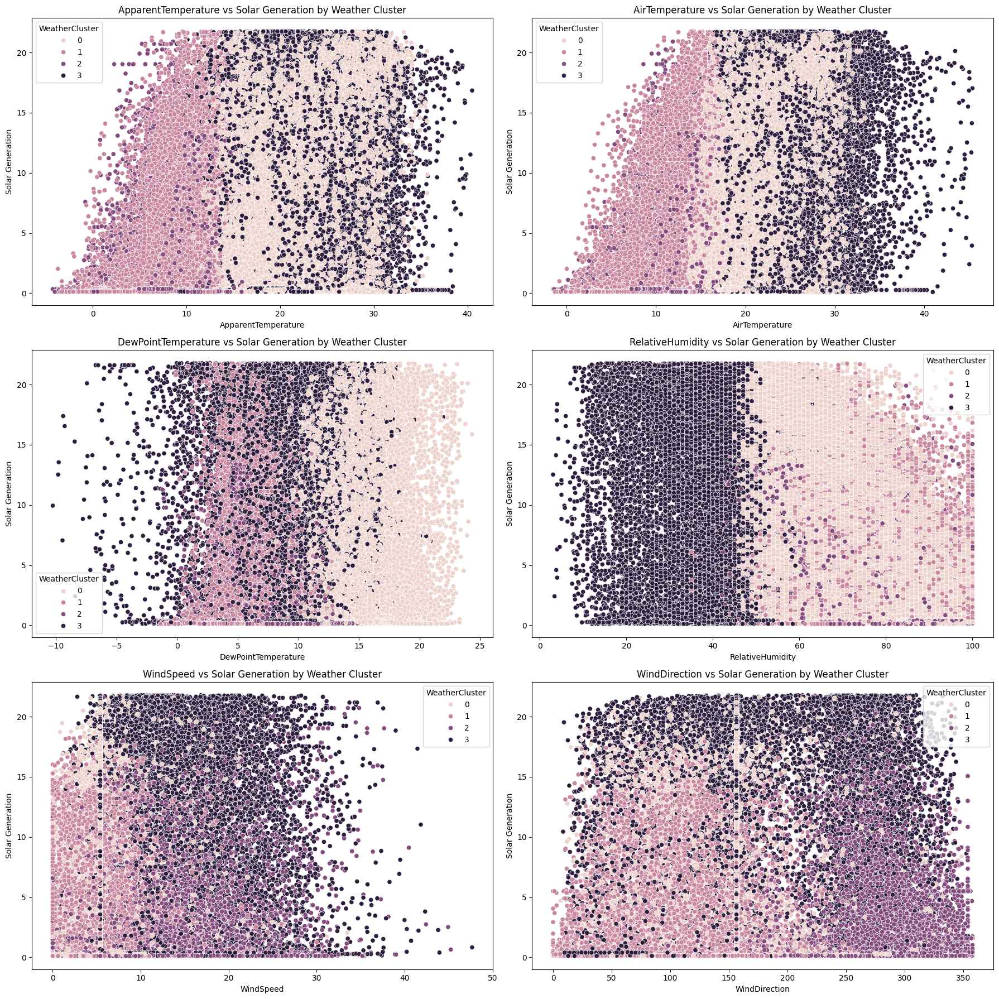

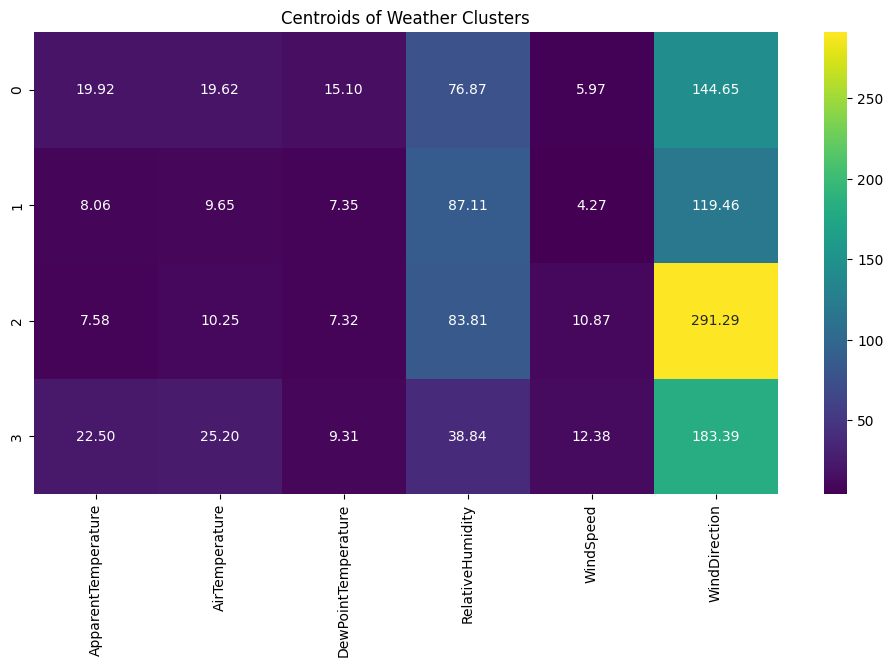

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your DataFrame is already loaded and named df

# Step 1: Prepare Combined Weather Features
weather_features = ['ApparentTemperature', 'AirTemperature', 'DewPointTemperature',
                     'RelativeHumidity', 'WindSpeed', 'WindDirection']

# Select and handle missing values
weather_data = df[weather_features].fillna(method='ffill')

# Step 2: Standardize Features
scaler = StandardScaler()
scaled_weather_data = scaler.fit_transform(weather_data)

# Determine the optimal number of clusters (e.g., using the Elbow Method)
inertia = []
for n in range(1, 11):
    kmeans = KMeans(n_clusters=n, random_state=42)
    kmeans.fit(scaled_weather_data)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

# Based on the Elbow Method, choose the number of clusters, e.g., k=4
n_clusters = 4  # Adjust based on the elbow plot
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['WeatherCluster'] = kmeans.fit_predict(scaled_weather_data)

# Step 3: Analyze Clusters
# Example: Analyze Solar Generation by Weather Cluster
plt.figure(figsize=(12, 6))
sns.boxplot(x='WeatherCluster', y='SolarGeneration', data=df)
plt.xlabel('Weather Cluster')
plt.ylabel('Solar Generation')
plt.title('Solar Generation by Weather Cluster')
plt.show()

# Visualize weather conditions in each cluster
fig, axes = plt.subplots(3, 2, figsize=(18, 18))  # Adjust size if needed
axes = axes.flatten()

# Create scatter plots for each weather feature against Solar Generation within clusters
for i, feature in enumerate(weather_features):
    sns.scatterplot(x=feature, y='SolarGeneration', hue='WeatherCluster', data=df, ax=axes[i])
    axes[i].set_title(f'{feature} vs Solar Generation by Weather Cluster')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Solar Generation')

plt.tight_layout()
plt.show()

# Optionally, visualize the centroids of each cluster
centroids = scaler.inverse_transform(kmeans.cluster_centers_)
centroids_df = pd.DataFrame(centroids, columns=weather_features)

plt.figure(figsize=(12, 6))
sns.heatmap(centroids_df, annot=True, cmap='viridis', fmt='.2f')
plt.title('Centroids of Weather Clusters')
plt.show()
